Problem Statement:
Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate 
market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market 
and there are various companies working in the domain. Data science comes as a very important tool to solve problems 
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and 
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, 
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing 
companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses 
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same 
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file 
below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model 
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest 
in them or not. For this company wants to know:
* Which variables are important to predict the price of variable?
* How do these variables describe the price of the house?

Business Goal:
You are required to model the price of houses with the available independent variables. This model will then be used 
by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the 
strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the 
management to understand the pricing dynamics of a new market

In [137]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# Working on Train data

In [138]:
housingtaindata=pd.read_csv('Housing_train.csv')

In [139]:
df_train=pd.DataFrame(housingtaindata)
df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

# Exploratory Data Analysis on train data :

In [140]:
df_train.shape

(1168, 81)

Train data has 1167 instances and 81 variables

In [141]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [142]:
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


Above are the 81 variables and their datatypes of the data set, we can observe that the data types are integers, floats and object.

In [143]:
# We can check the columns with each data type
float_columns=df_train.select_dtypes(include=[float])
float_columns

,LotFrontage,MasVnrArea,GarageYrBlt
0,NaN,0.0,1977.0
1,95.0,0.0,1970.0
2,92.0,0.0,1997.0
3,105.0,480.0,1977.0
4,NaN,126.0,1977.0
5,58.0,0.0,2006.0
6,NaN,180.0,1957.0
7,88.0,67.0,1957.0
8,70.0,0.0,1965.0
9,80.0,0.0,1947.0


There are only 3 columns with float data type - LotFrontage, MasVnrArea and GarageYrBlt which tells us about
1. LotFrontage : Linear feet of street connected to property
2. MasVnrArea : Masonry veneer area in square feet
3. GarageYrBlt : Year garage was built

<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

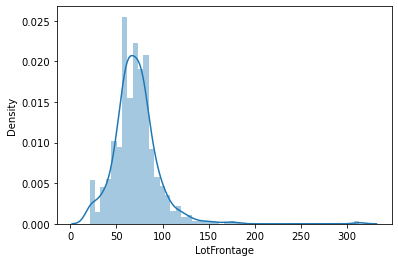

In [144]:
# We can now check for the data distribution in these columns and relatioship they have with the variable SalePrice
sns.distplot(df_train['LotFrontage'])

In this column Linear feet of street connected to property is described, the linear feet of street is mostly varying from 20 to 150 and the data has slight left skewness

<AxesSubplot:xlabel='MasVnrArea', ylabel='Count'>

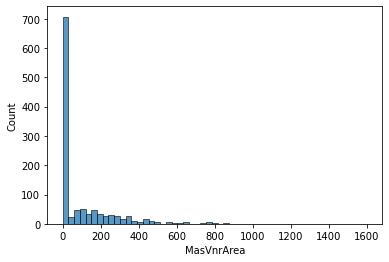

In [145]:
sns.histplot(df_train['MasVnrArea'])

Masonry veneer area in square feet, data in this varies from 0 to 800 and the data has left skewness, we can observe in most of the cases the value for this variable is 0 

<AxesSubplot:xlabel='GarageYrBlt', ylabel='Density'>

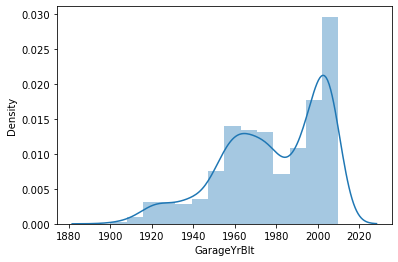

In [146]:
sns.distplot(df_train['GarageYrBlt'])

The data in this ranges from 1900 to 2000, the data has right skewness and we can observe that most of the garages were built in the year 2000

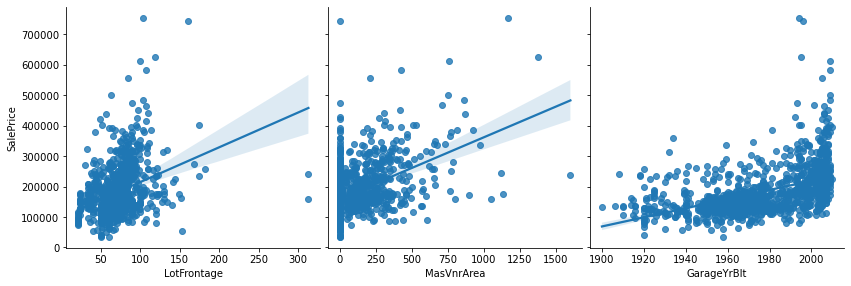

In [147]:
sns.pairplot(df_train, x_vars=['LotFrontage','MasVnrArea','GarageYrBlt'], y_vars='SalePrice', height=4, aspect=1, kind='reg')
plt.show()

* In the plot LotFrontage Vs SalePrice we can observe that the linear feet of street which is connected to property is mostly ranging from 10 to 120 and for thses ranges the sale price is ranging from 2000 to 40000
* The Masonry veneer area is ranging from 0 to 1000 in most of the cases and price for this range is from 5000 to 40000
* In the plot GarageYrBlt Vs SalePrice we can observe that as the year when the garage was built goes insceasing price of the property increases

In [148]:
int_columns=df_train.select_dtypes(include=[int])
print(int_columns.columns)
print(int_columns.shape)

Index(['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')
(1168, 35)


There are  variables in the dataset with integer data type which are listed above
* The column Id an unique number given to the property and it doesn't make any impact on the SalePrice (This variable can be dropped)
* MSSubClass: Identifies the type of dwelling involved in the sale.
* LotArea: Lot size in square feet
* OverallQual: Rates the overall material and finish of the house
* OverallCond: Rates the overall condition of the house
* YearBuilt: Original construction date
* YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)
* BsmtFinSF1: Type 1 finished square feet
* BsmtFinSF2: Type 2 finished square feet
* BsmtUnfSF: Unfinished square feet of basement area
* TotalBsmtSF: Total square feet of basement area
* 1stFlrSF: First Floor square feet
* 2ndFlrSF: Second floor square feet
* LowQualFinSF: Low quality finished square feet (all floors)
* GrLivArea: Above grade (ground) living area square feet
* BsmtFullBath: Basement full bathrooms
* BsmtHalfBath: Basement half bathrooms
* FullBath: Full bathrooms above grade
* HalfBath: Half baths above grade
* BedroomAbvGr: Bedrooms above grade (does NOT include basement bedrooms)
* KitchenAbvGr: Kitchens above grade
* TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
* Fireplaces: Number of fireplaces
* GarageCars: Size of garage in car capacity
* GarageArea: Size of garage in square feet
* WoodDeckSF: Wood deck area in square feet
* OpenPorchSF: Open porch area in square feet
* EnclosedPorch: Enclosed porch area in square feet
* 3SsnPorch: Three season porch area in square feet
* ScreenPorch: Screen porch area in square feet
* PoolArea: Pool area in square feet
* MiscVal: $Value of miscellaneous feature
* MoSold: Month Sold (MM)
* YrSold: Year Sold (YYYY)
* SalePrice: Price of the property

<AxesSubplot:xlabel='MSSubClass', ylabel='count'>

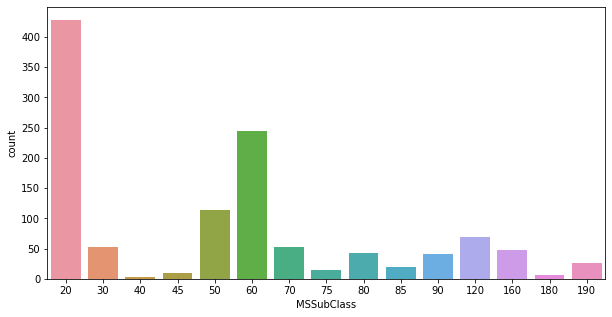

In [149]:
plt.figure(figsize=(10,5))
sns.countplot(df_train['MSSubClass'])

The number in the plot indicates each category as mentioned below
* 20 - 1-STORY 1946 & NEWER ALL STYLES
* 30 - 1-STORY 1945 & OLDER
* 40 - 1-STORY W/FINISHED ATTIC ALL AGES
* 45 - 1-1/2 STORY - UNFINISHED ALL AGES
* 50 - 1-1/2 STORY FINISHED ALL AGES
* 60 - 2-STORY 1946 & NEWER
* 70 - 2-STORY 1945 & OLDER
* 75 - 2-1/2 STORY ALL AGES
* 80 - SPLIT OR MULTI-LEVEL
* 85 - SPLIT FOYER
* 90 - DUPLEX - ALL STYLES AND AGES
* 120 - 1-STORY PUD (Planned Unit Development) - 1946 & NEWER
* 150 - 1-1/2 STORY PUD - ALL AGES
* 160 - 2-STORY PUD - 1946 & NEWER
* 180 - PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
* 190 - 2 FAMILY CONVERSION - ALL STYLES AND AGES

We can observe that 400+ prperties are of 1 story built in 1946 and has all newer styles

<AxesSubplot:xlabel='LotArea', ylabel='Count'>

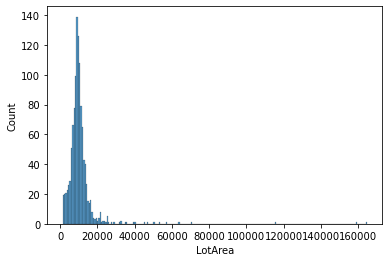

In [150]:
sns.histplot(df_train['LotArea'])

The Lotarea tells us about Lot area in square feet and the data in this is dense from 1300 to 25000

Text(0.5, 1.0, 'Over all condition')

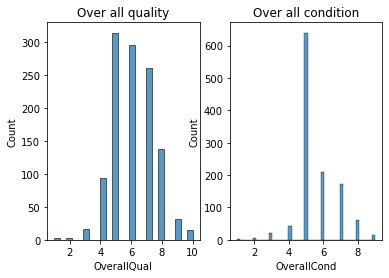

In [151]:
plt.subplot(1,2,1)
sns.histplot(df_train['OverallQual'])
plt.title('Over all quality')
plt.subplot(1,2,2)
sns.histplot(df_train['OverallCond'])
plt.title('Over all condition')

The columns OverallQual and OverallCond tellus about the ratings given to the property with respect to its quality and condition, most of the properties' quality is rated 5 to 7 max and condition is rated 5 on maximum

Text(0.5, 1.0, 'Year the property was remodeled')

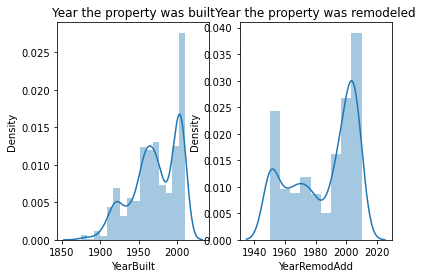

In [152]:
plt.subplot(1,2,1)
sns.distplot(df_train['YearBuilt'])
plt.title('Year the property was built')
plt.subplot(1,2,2)
sns.distplot(df_train['YearRemodAdd'])
plt.title('Year the property was remodeled')

The years in YearBuilt starts from 1850 and in case of remodelled year it startes from 1940, both the variables ahve right skewness

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='Density'>

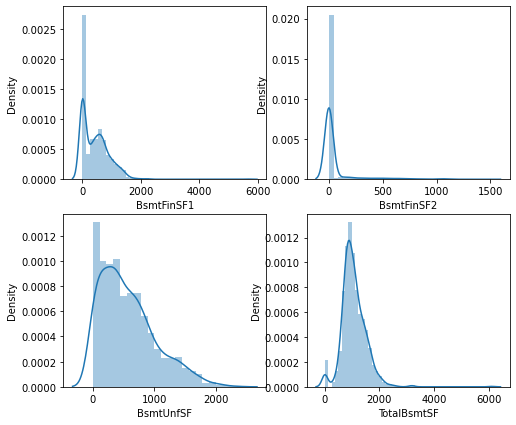

In [153]:
figure, axes = plt.subplots(2,2,figsize=(8,7))
sns.distplot(df_train['BsmtFinSF1'],ax=axes[0,0])
sns.distplot(df_train['BsmtFinSF2'],ax=axes[0,1])
sns.distplot(df_train['BsmtUnfSF'],ax=axes[1,0])
sns.distplot(df_train['TotalBsmtSF'],ax=axes[1,1])

All the 4 columns 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF' are left skewed

<AxesSubplot:xlabel='LowQualFinSF', ylabel='Density'>

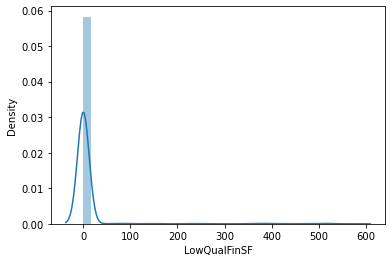

In [154]:
sns.distplot(df_train['LowQualFinSF'])

We can observe that the data in this column is highly spreaded

<AxesSubplot:xlabel='GrLivArea', ylabel='Count'>

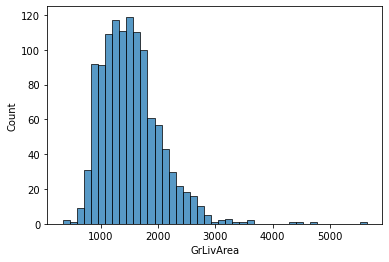

In [155]:
sns.histplot(df_train['GrLivArea'])

This is about the above ground living area in sr ft, the area mostly ranges from 1000 to 3000 sq ft for maximum properties

<AxesSubplot:xlabel='2ndFlrSF', ylabel='Density'>

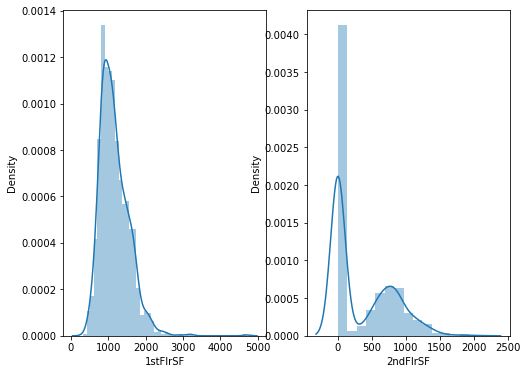

In [156]:
figure, axes = plt.subplots(1,2,figsize=(8,6))
sns.distplot(df_train['1stFlrSF'],ax=axes[0])
sns.distplot(df_train['2ndFlrSF'],ax=axes[1])

These 2 variables tells about the area of 1st floor and 2nd floor

<AxesSubplot:xlabel='HalfBath', ylabel='Density'>

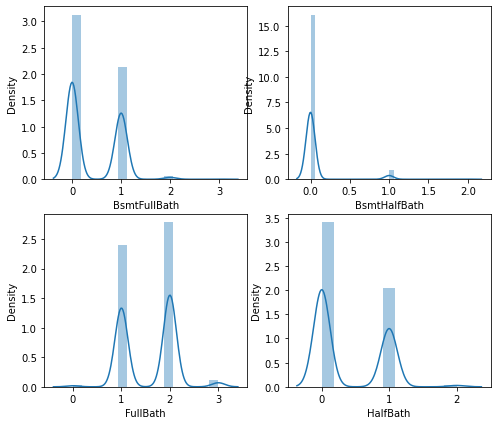

In [157]:
figure, axes = plt.subplots(2,2,figsize=(8,7))
sns.distplot(df_train['BsmtFullBath'],ax=axes[0,0])
sns.distplot(df_train['BsmtHalfBath'],ax=axes[0,1])
sns.distplot(df_train['FullBath'],ax=axes[1,0])
sns.distplot(df_train['HalfBath'],ax=axes[1,1])

These columns are to tell about number of full and half bathrooms is basement and above grade, We can see that there is left skewness in the columns BsmtFullBath and BsmtHalfBath

<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='Density'>

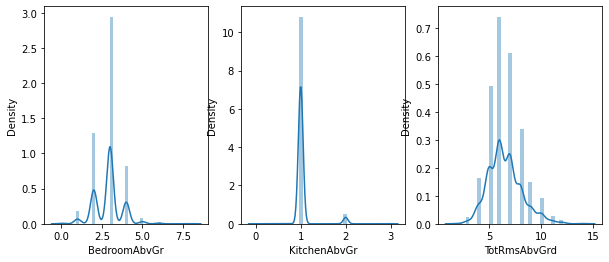

In [158]:
figure, axes = plt.subplots(1,3,figsize=(10,4))
sns.distplot(df_train['BedroomAbvGr'],ax=axes[0])
sns.distplot(df_train['KitchenAbvGr'],ax=axes[1])
sns.distplot(df_train['TotRmsAbvGrd'],ax=axes[2])

The above variables are to tell about number of bedrooms, Kitchen and rooms above grade

<AxesSubplot:xlabel='ScreenPorch', ylabel='Density'>

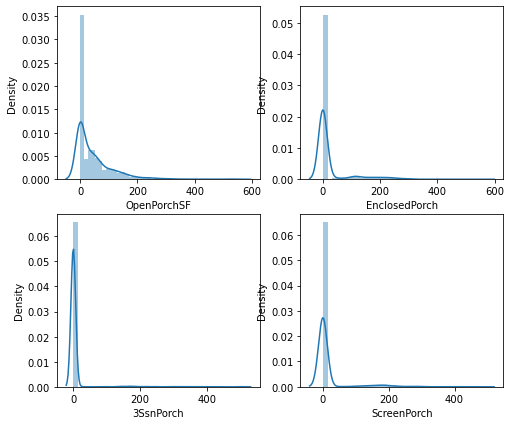

In [159]:
figure, axes = plt.subplots(2,2,figsize=(8,7))
sns.distplot(df_train['OpenPorchSF'],ax=axes[0,0])
sns.distplot(df_train['EnclosedPorch'],ax=axes[0,1])
sns.distplot(df_train['3SsnPorch'],ax=axes[1,0])
sns.distplot(df_train['ScreenPorch'],ax=axes[1,1])

These variables are about open, closed, 3 season and screen porch area in sq ft of the property

<Figure size 864x360 with 0 Axes>

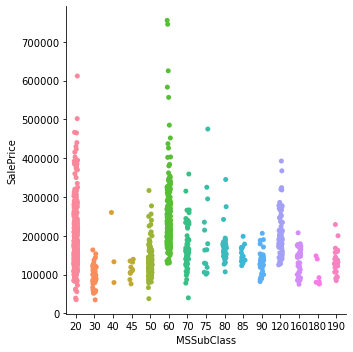

In [160]:
plt.figure(figsize = (12,5))
sns.catplot(y='SalePrice', x='MSSubClass', data=df_train)

From the about category plot we can observe that the sale price is highest for those properties which are 2-STORY 1946 & NEWER

<AxesSubplot:xlabel='OverallQual', ylabel='SalePrice'>

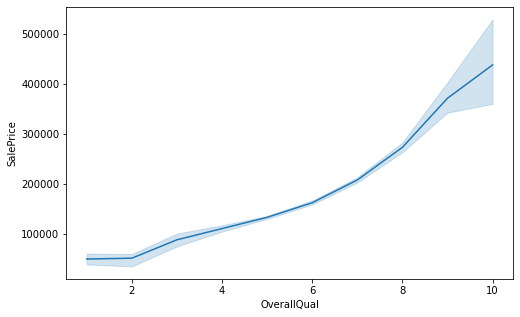

In [161]:
plt.figure(figsize = (8,5))
sns.lineplot(y='SalePrice', x='OverallQual', data=df_train)

From the above plot it is clear that Price increases as the overall ratings of the property increase

<Figure size 576x360 with 0 Axes>

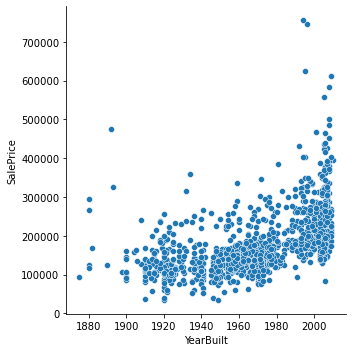

In [162]:
plt.figure(figsize = (8,5))
sns.relplot(y='SalePrice', x='YearBuilt', data=df_train)

From the above plot we can conclude that the Price is high for those properties bulit in latest years than the older properties

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='SalePrice'>

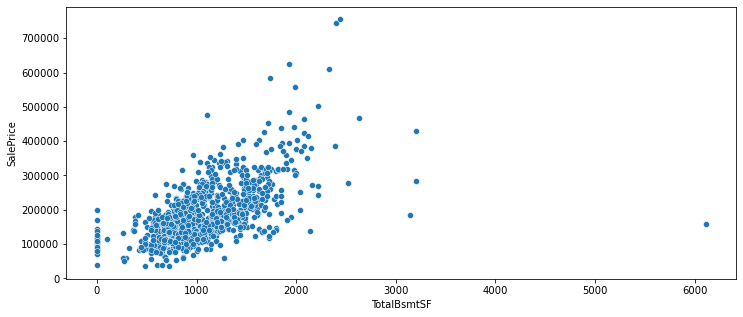

In [163]:
plt.figure(figsize = (12,5))
sns.scatterplot(y='SalePrice', x='TotalBsmtSF', data=df_train)

From the above plot we can observe that the Price increases with the increase of total basement area in crease and from 2500 the price slightly reduces for few properties

<AxesSubplot:xlabel='FullBath', ylabel='SalePrice'>

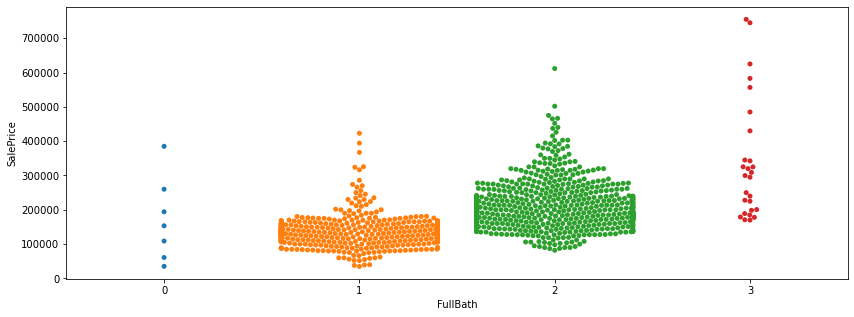

In [164]:
plt.figure(figsize = (14,5))
sns.swarmplot(x='FullBath', y='SalePrice', data=df_train)

From the above plot we can observe that most of the properties has 1 or 2 Full bathrooms above grade and as the number of bathrooms increase the Price of the property increases

<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='SalePrice'>

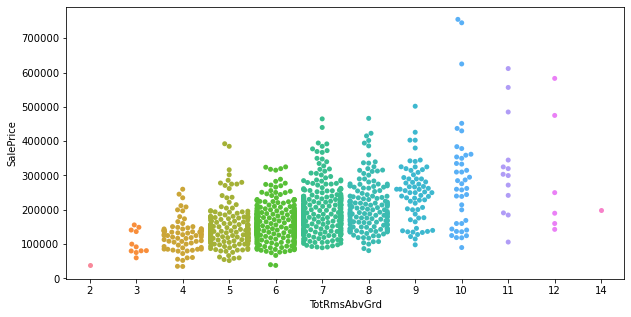

In [165]:
plt.figure(figsize = (10,5))
sns.swarmplot(x='TotRmsAbvGrd', y='SalePrice', data=df_train)

The price is highest for those properties which has total rooms above grade as 10 and it is least for the property which has 2 rooms

<AxesSubplot:xlabel='GarageArea', ylabel='SalePrice'>

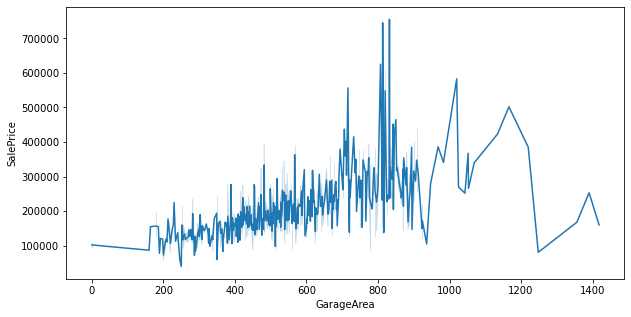

In [166]:
plt.figure(figsize = (10,5))
sns.lineplot(y='SalePrice', x='GarageArea', data=df_train)

Price of the property increases with the increase in area of garage

<AxesSubplot:xlabel='PoolArea', ylabel='SalePrice'>

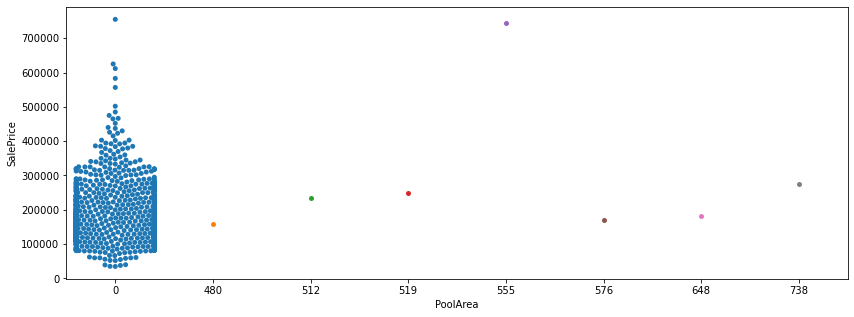

In [167]:
plt.figure(figsize = (14,5))
sns.swarmplot(x='PoolArea', y='SalePrice', data=df_train)

We can observe that maximum properties have no pool area and for those countable number of properties which has pool price ranges from 150000 to 300000

<AxesSubplot:xlabel='MiscVal', ylabel='SalePrice'>

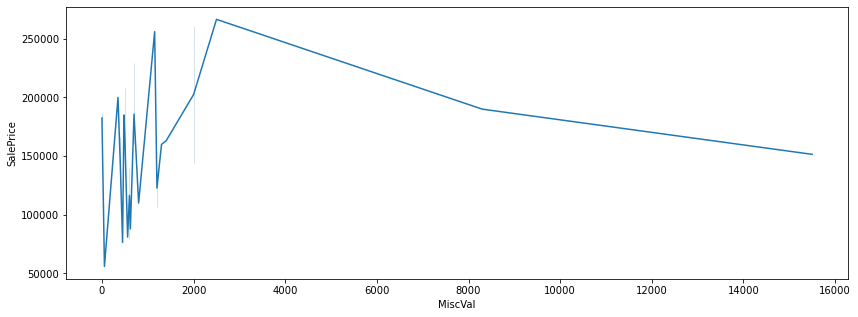

In [168]:
plt.figure(figsize = (14,5))
sns.lineplot(x='MiscVal', y='SalePrice', data=df_train)

From 0 to 2500 we can see that the price increases with the increase in the $Value of miscellaneous feature and it goes reducing gradually from 2500

In [169]:
Obj_columns=df_train.select_dtypes(include=[object])
print(Obj_columns.columns)
print(Obj_columns.shape)

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')
(1168, 43)


Above are the 43 variables which have categorical data, we can study about these in detailed and check for its relatioship with SalePrice

<AxesSubplot:xlabel='MSZoning', ylabel='count'>

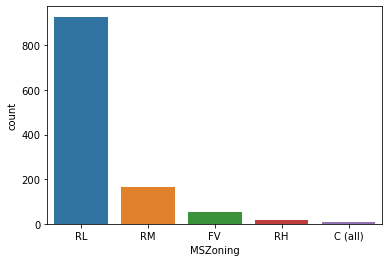

In [170]:
sns.countplot(df_train['MSZoning'])

From the above plot we can observe that most of the properties are located in RL (Residential Low Density) zone and very less number of properties are in c(commercial) area.

MSZoning: Identifies the general zoning classification of the sale.

       A - Agriculture
       C - Commercial
       FV - Floating Village Residential
       I - Industrial
       RH - Residential High Density
       RL - Residential Low Density
       RP - Residential Low Density Park 
       RM - Residential Medium Density

<AxesSubplot:xlabel='LandContour', ylabel='count'>

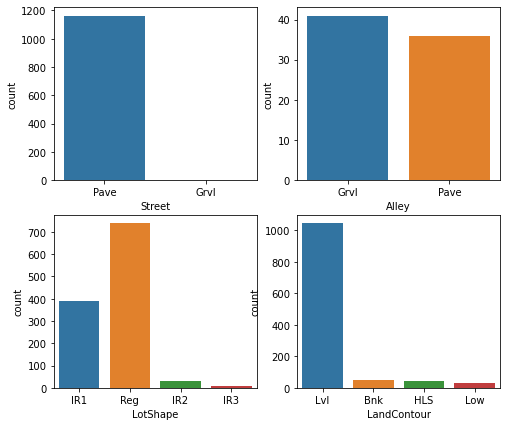

In [171]:
figure, axes = plt.subplots(2,2,figsize=(8,7))
sns.countplot(df_train['Street'],ax=axes[0,0])
sns.countplot(df_train['Alley'],ax=axes[0,1])
sns.countplot(df_train['LotShape'],ax=axes[1,0])
sns.countplot(df_train['LandContour'],ax=axes[1,1])

The above 4 columns guves us details about
1. Street: Type of road access to property

       Grvl-Gravel
       Pave-Paved
    
2. Alley: Type of alley access to property

       Grvl-Gravel
       Pave-Paved
       NA-No alley access
        
3. LotShape: General shape of property

       Reg-Regular
       IR1-Slightly irregular
       IR2-Moderately Irregular
       IR3-Irregular
    
4. LandContour: Flatness of the property

       Lvl-Near Flat/Level
       Bnk-Banked - Quick and significant rise from street grade to building
       HLS-Hillside - Significant slope from side to side
       Low-Depression

In [172]:
df_train['Alley'].isnull().sum()

1091

In the Alley column we can see that there are 1091 blanks and it is speified that for those blank values there is no No alley access, so we can fill these blanks with NA.

<AxesSubplot:xlabel='Alley', ylabel='count'>

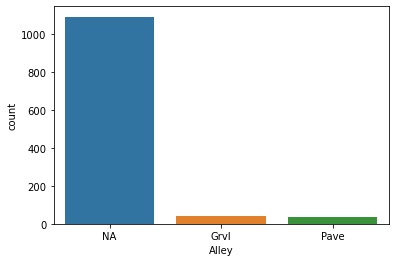

In [173]:
df_train['Alley'].fillna('NA',inplace=True)
sns.countplot(df_train['Alley'])

<AxesSubplot:xlabel='BldgType', ylabel='count'>

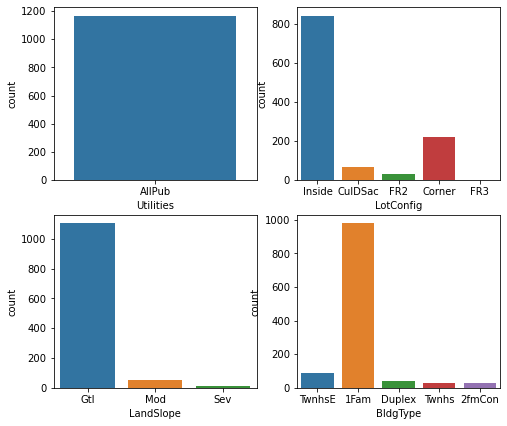

In [174]:
figure, axes = plt.subplots(2,2,figsize=(8,7))
sns.countplot(df_train['Utilities'],ax=axes[0,0])
sns.countplot(df_train['LotConfig'],ax=axes[0,1])
sns.countplot(df_train['LandSlope'],ax=axes[1,0])
sns.countplot(df_train['BldgType'],ax=axes[1,1])

The above 4 columns are about :

1. Utilities: Type of utilities available

       AllPub-All public Utilities (E,G,W,& S)
       NoSewr-Electricity, Gas, and Water (Septic Tank)
       NoSeWa-Electricity and Gas Only
       ELO-Electricity only
    
2. LotConfig: Lot configuration

       Inside-Inside lot
       Corner-Corner lot
       CulDSac-Cul-de-sac
       FR2-Frontage on 2 sides of property
       FR3-Frontage on 3 sides of property
        
3. LandSlope: Slope of property

       Gtl-Gentle slope
       Mod-Moderate Slope
       Sev-Severe Slope
        
4. BldgType: Type of dwelling

       1Fam-Single-family Detached
       2FmCon-Two-family Conversion; originally built as one-family dwelling
       Duplx-Duplex
       TwnhsE-Townhouse End Unit
       TwnhsI-Townhouse Inside Unit

<AxesSubplot:xlabel='Condition2', ylabel='count'>

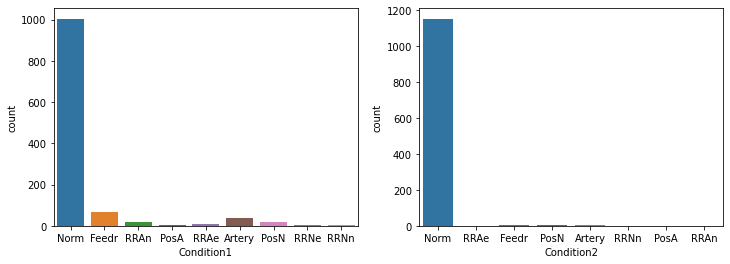

In [175]:
figure, axes = plt.subplots(1,2,figsize=(12,4))
sns.countplot(df_train['Condition1'],ax=axes[0])
sns.countplot(df_train['Condition2'],ax=axes[1])

1. Condition1: Proximity to various conditions

       Artery-Adjacent to arterial street
       Feedr-Adjacent to feeder street
       Norm-Normal
       RRNn-Within 200' of North-South Railroad
       RRAn-Adjacent to North-South Railroad
       PosN-Near positive off-site feature--park, greenbelt, etc.
       PosA-Adjacent to postive off-site feature
       RRNe-Within 200' of East-West Railroad
       RRAeAdjacent to East-West Railroad

2. Condition2: Proximity to various conditions (if more than one is present)

       Artery-Adjacent to arterial street
       Feedr-Adjacent to feeder street
       Norm-Normal
       RRNn-Within 200' of North-South Railroad
       RRAn-Adjacent to North-South Railroad
       PosN-Near positive off-site feature--park, greenbelt, etc.
       PosA-Adjacent to postive off-site feature
       RRNe-Within 200' of East-West Railroad
       RRAe-Adjacent to East-West Railroad

<AxesSubplot:xlabel='Exterior2nd', ylabel='count'>

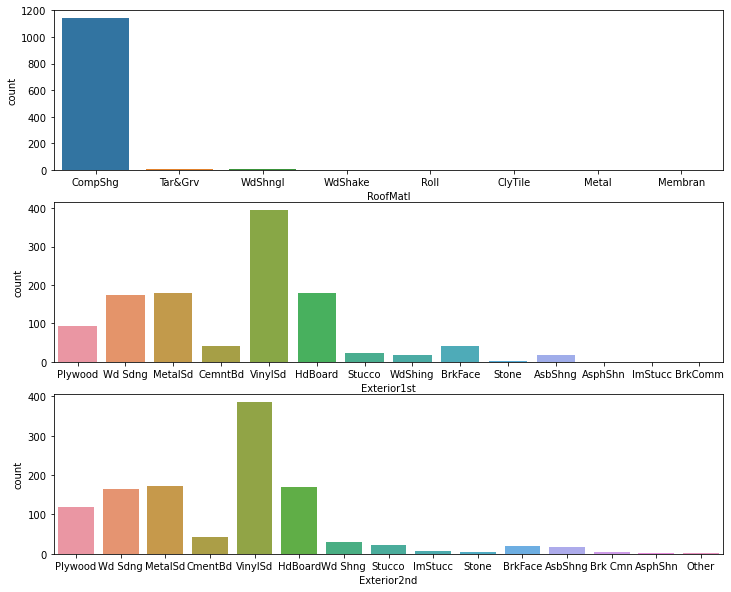

In [176]:
figure, axes = plt.subplots(3,1,figsize=(12,10))
sns.countplot(df_train['RoofMatl'],ax=axes[0])
sns.countplot(df_train['Exterior1st'],ax=axes[1])
sns.countplot(df_train['Exterior2nd'],ax=axes[2])

The above 3 plot gives us details about :
1. RoofMatl: Roof material

       ClyTile-Clay or Tile
       CompShg-Standard (Composite) Shingle
       Membran-Membrane
       Metal-Metal
       Roll-Roll
       Tar&Grv-Gravel & Tar
       WdShake-Wood Shakes
       WdShngl-Wood Shingles

2. Exterior1st: Exterior covering on house

       AsbShng-Asbestos Shingles
       AsphShn-Asphalt Shingles
       BrkComm-Brick Common
       BrkFace-Brick Face
       CBlock-Cinder Block
       CemntBd-Cement Board
       HdBoard-Hard Board
       ImStucc-Imitation Stucco
       MetalSd-Metal Siding
       Other-Other
       Plywood-Plywood
       PreCast-PreCast
       Stone-Stone
       Stucco-Stucco
       VinylSd-Vinyl Siding
       Wd Sdng-Wood Siding
       WdShing-Wood Shingles

3. Exterior2nd: Exterior covering on house (if more than one material)

       AsbShng-Asbestos Shingles
       AsphShn-Asphalt Shingles
       BrkComm-Brick Common
       BrkFace-Brick Face
       CBlock-Cinder Block
       CemntBd-Cement Board
       HdBoard-Hard Board
       ImStucc-Imitation Stucco
       MetalSd-Metal Siding
       Other-Other
       Plywood-Plywood
       PreCast-PreCast
       Stone-Stone
       Stucco-Stucco
       VinylSd-Vinyl Siding
       Wd Sdng-Wood Siding
       WdShing-Wood Shingles

<AxesSubplot:xlabel='BsmtFinType1', ylabel='count'>

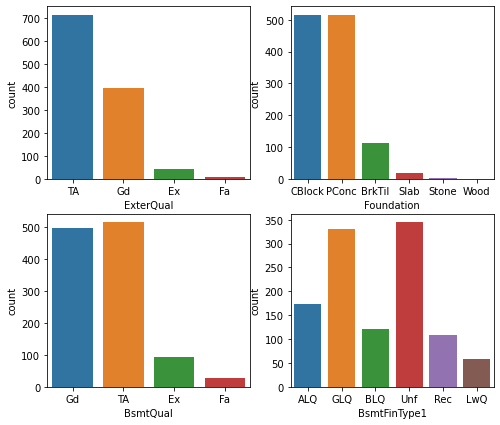

In [177]:
figure, axes = plt.subplots(2,2,figsize=(8,7))
sns.countplot(df_train['ExterQual'],ax=axes[0,0])
sns.countplot(df_train['Foundation'],ax=axes[0,1])
sns.countplot(df_train['BsmtQual'],ax=axes[1,0])
sns.countplot(df_train['BsmtFinType1'],ax=axes[1,1])

The above 4 variables gives us details about :

1. ExterQual: Evaluates the quality of the material on the exterior 

       Ex-Excellent
       Gd-Good
       TA-Average/Typical
       Fa-Fair
       Po-Poor
    
2. Foundation: Type of foundation

       BrkTil-Brick & Tile
       CBlock-Cinder Block
       PConc-Poured Contrete
       Slab-Slab
       Stone-Stone
       Wood-Wood
        
3. BsmtQual: Evaluates the height of the basement

       Ex-Excellent (100+ inches)
       Gd-Good (90-99 inches)
       TA-Typical (80-89 inches)
       Fa-Fair (70-79 inches)
       Po-Poor (<70 inches
       NA-No Basement
        
4. BsmtFinType1: Rating of basement finished area

       GLQ-Good Living Quarters
       ALQ-Average Living Quarters
       BLQ-Below Average Living Quarters
       Rec-Average Rec Room
       LwQ-Low Quality
       Unf-Unfinshed
       NA-No Basement

<AxesSubplot:xlabel='Functional', ylabel='count'>

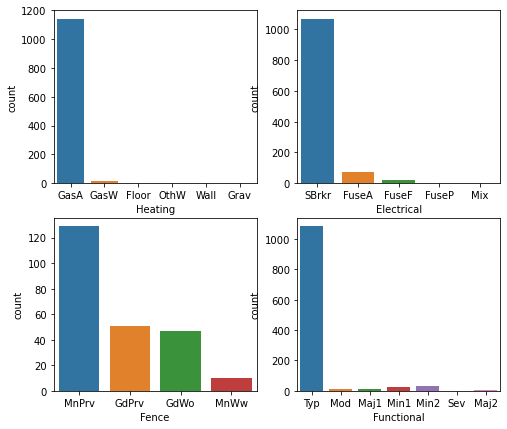

In [178]:
figure, axes = plt.subplots(2,2,figsize=(8,7))
sns.countplot(df_train['Heating'],ax=axes[0,0])
sns.countplot(df_train['Electrical'],ax=axes[0,1])
sns.countplot(df_train['Fence'],ax=axes[1,0])
sns.countplot(df_train['Functional'],ax=axes[1,1])

The above 4 variables are catogorised as :
    
1. Heating: Type of heating

       Floor-Floor Furnace
       GasA-Gas forced warm air furnace
       GasW-Gas hot water or steam heat
       Grav-Gravity furnace
       OthW-Hot water or steam heat other than gas
       Wall-Wall furnace
    
2. Heating: Type of heating

       Floor-Floor Furnace
       GasA-Gas forced warm air furnace
       GasW-Gas hot water or steam heat
       Grav-Gravity furnace
       OthW-Hot water or steam heat other than gas
       Wall-Wall furnace
    
3. Fence: Fence quality

       GdPrv-Good Privacy
       MnPrv-Minimum Privacy
       GdWo-Good Wood
       MnWw-Minimum Wood/Wire
       NA-No Fence
        
4. Functional: Home functionality (Assume typical unless deductions are warranted)

       Typ-Typical Functionality
       Min1-Minor Deductions 1
       Min2-Minor Deductions 2
       Mod-Moderate Deductions
       Maj1-Major Deductions 1
       Maj2-Major Deductions 2
       Sev-Severely Damaged
       Sal-Salvage only

In the columns Alley, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, FireplaceQu, GarageType, GarageFinish, GarageQual, GarageCond, PoolQC, Fence, MiscFeature We can observe that there are some senarios given for NA and NA is not been mentioned in the dataset, so for thses columns we can manually fill in NA

In [179]:
Na_cols=['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']
for col in Na_cols:
    (df_train[col].fillna('NA',inplace=True))

<AxesSubplot:xlabel='LotShape', ylabel='SalePrice'>

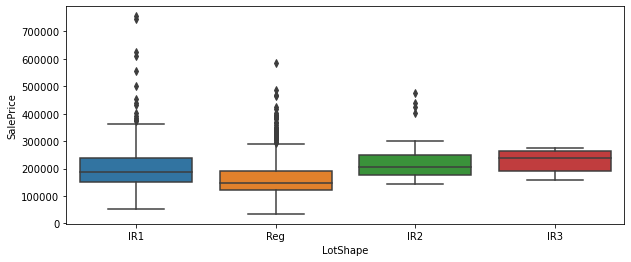

In [180]:
# Checking for relationship of SalePrice with Categorical data variables
plt.figure(figsize=(10,4))
sns.boxplot(x='LotShape', y='SalePrice', data=df_train)

From the above plot we can observe that the price is highest for those properties whose shape is Slightly irregular

<AxesSubplot:xlabel='LandSlope', ylabel='SalePrice'>

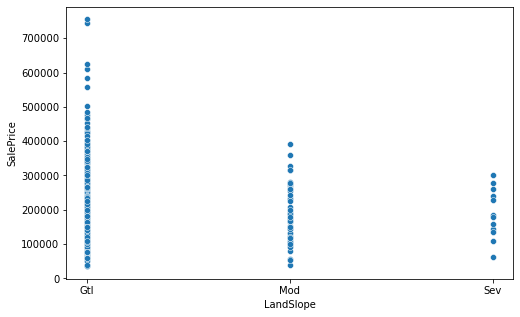

In [181]:
plt.figure(figsize = (8,5))
sns.scatterplot(x='LandSlope', y='SalePrice', data=df_train)

From the above plot we can observe that the Price of the property is highest for those which has Gentle slope

<AxesSubplot:xlabel='ExterQual', ylabel='SalePrice'>

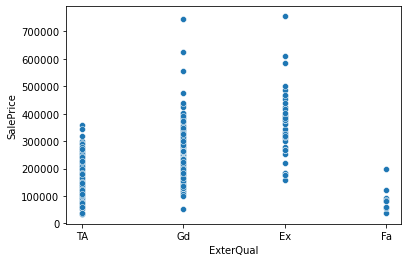

In [182]:
sns.scatterplot(x='ExterQual', y='SalePrice', data=df_train)

From the above plot we can see that the Price of the property is high for those which has the external quality rating as Good and Excellent

<AxesSubplot:xlabel='BsmtQual', ylabel='SalePrice'>

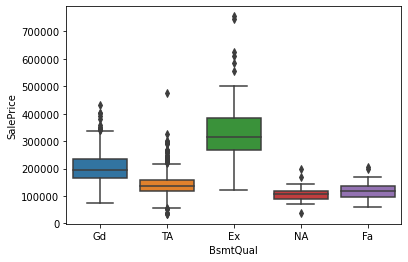

In [183]:
sns.boxplot(x='BsmtQual', y='SalePrice', data=df_train)

From the above plot we can observe that the price is high for the property which has Basement quality rating as Excellent

<AxesSubplot:xlabel='FireplaceQu', ylabel='SalePrice'>

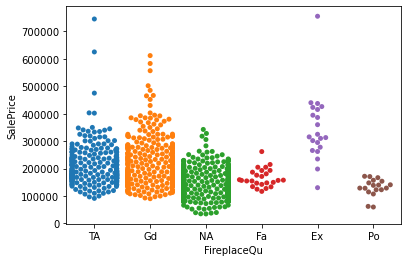

In [184]:
sns.swarmplot(x='FireplaceQu', y='SalePrice', data=df_train)

From the above plot we can observe that the price of the property is high for tjose which has Fire place quality as Excellent and Average

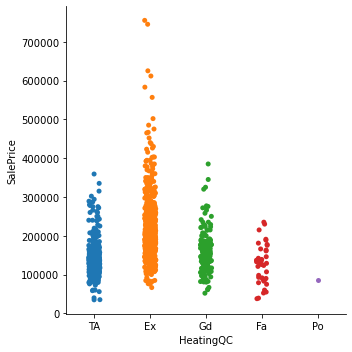

In [185]:
sns.catplot(x='HeatingQC', y='SalePrice', data=df_train)

From the above plot we can observe that the Price of the property is high for those which has Heating quality is Excellent

In [186]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          1168 non-null   object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [187]:
df_train.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
Street             0
Alley              0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         7
MasVnrArea         7
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

From the above details we can see that missing values are present only in LotFrontage, MasVnrType, MasVnrArea and GarageYrBlt and these variables are on Object and float datatypes we can fill in the missing values using simple imputer

In [188]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan,strategy='most_frequent')
df_train['MasVnrType']=imputer.fit_transform(df_train['MasVnrType'].values.reshape(-1,1))

In [189]:
float_missing=['LotFrontage','MasVnrArea','GarageYrBlt']
Simputer = SimpleImputer(missing_values=np.nan,strategy='median')
for col in float_missing:
    df_train[col]=Simputer.fit_transform(df_train[col].values.reshape(-1,1))

Hence the missing values are treated

In [190]:
# Encoding the columns that has object dtype
Object_columns=df_train.select_dtypes(include=[object])
Object_columns.head(1)

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,Gable,CompShg,Plywood,Plywood,None,TA,TA,CBlock,Gd,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NA,NA,NA,WD,Normal


In [191]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [192]:
for columns in Object_columns:
    df_train[columns] = le.fit_transform(df_train[columns])

In [193]:
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning           int32
LotFrontage      float64
LotArea            int64
Street             int32
Alley              int32
LotShape           int32
LandContour        int32
Utilities          int32
LotConfig          int32
LandSlope          int32
Neighborhood       int32
Condition1         int32
Condition2         int32
BldgType           int32
HouseStyle         int32
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle          int32
RoofMatl           int32
Exterior1st        int32
Exterior2nd        int32
MasVnrType         int32
MasVnrArea       float64
ExterQual          int32
ExterCond          int32
Foundation         int32
BsmtQual           int32
BsmtCond           int32
BsmtExposure       int32
BsmtFinType1       int32
BsmtFinSF1         int64
BsmtFinType2       int32
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating            int32


Hence all the columns in the dataset are in float and integer data types

In [194]:
pd.set_option('display.max_columns', None)
df_train.describe()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.0,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,3.013699,70.807363,10484.749144,0.996575,0.995719,1.938356,2.773973,0.0,3.004281,0.064212,12.145548,2.032534,2.005993,0.476027,3.043664,6.104452,5.595890,1970.930651,1984.758562,1.402397,1.086473,8.659247,9.363014,1.758562,101.696918,2.530822,3.725171,1.395548,2.725171,3.669521,2.920377,3.161815,444.726027,5.581336,46.647260,569.721747,1061.095034,1.035959,1.569349,0.933219,3.688356,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,2.328767,6.542808,5.742295,0.617295,3.092466,2.499144,1978.292808,1.886130,1.776541,476.860445,4.718322,4.764555,1.853596,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,2.988870,3.475171,1.070205,47.315068,6.344178,2007.804795,7.465753,3.768836,181477.005993
std,416.159877,41.940650,0.633120,22.440317,8957.442311,0.058445,0.256832,1.412262,0.710027,0.0,1.642667,0.284088,6.010364,0.871703,0.250035,1.180870,1.898625,1.390153,1.124343,30.145255,20.785185,0.832539,0.642848,3.097443,3.462380,0.611174,182.218483,0.699425,0.744463,0.709379,1.272200,0.980720,1.574648,2.252375,462.664785,1.203491,163.520016,449.375525,442.272249,0.302078,1.749129,0.249749,1.042606,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,0.832992,1.598484,0.987250,0.650575,1.173111,1.935551,24.202053,1.188295,0.745554,214.466769,0.896689,0.797518,0.501894,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,0.157245,1.112090,0.377430,543.264432,2.686352,1.329738,1.619459,1.112208,79105.586863
min,1.000000,20.000000,0.000000,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

Key Observations :
* Mean > median (50th percentile) in the columns MSSubClass, LotArea, MasVnrArea, BsmtFinType1, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, Heating, HeatingQC, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, MiscVal, SalePrice have left skewness in the data
* We can observe that there is a huge gap between 75th percentile and max in the columns Id, MSSubClass, MSZoning, LotFrontage, LotArea, LandSlope, Neighborhood, Condition1, Condition2, BldgType, MasVnrArea, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, TotRmsAbvGrd, GarageArea, WoodDeckSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, MiscVal, SalePrice we can tell that outliers are present in these columns
* In almost all the columns we can see that there is a high gap between mean and std hence the data is highly spreaded

In [195]:
df_train.corr()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,1.000000,0.004259,0.009307,-0.006165,-0.029212,0.003613,-0.002664,0.022978,-0.020245,NaN,0.053927,0.007152,-0.014989,0.000425,0.031623,0.026302,0.014518,-0.036965,0.039761,-0.016942,-0.018590,0.037059,-0.023900,-0.045575,-0.045721,0.064161,-0.061397,-0.006231,0.039946,-0.006339,0.042927,0.018410,-0.035282,0.012822,0.003868,0.038308,0.005269,-0.019494,-0.013812,0.041861,0.005955,0.003921,0.037801,0.009647,-0.029671,-0.070180,-0.024325,0.023027,-0.043572,-0.015187,-0.028512,0.009376,0.001216,-0.000240,-0.001613,0.019812,-0.024175,0.003197,0.004283,-0.000585,0.010664,0.007549,0.010048,-0.005277,-0.000456,-0.009755,-0.027498,-0.013642,0.004885,-0.021773,0.005169,0.065832,-0.039536,-0.002688,-0.009384,0.001304,0.023479,-0.008853,0.024384,-0.014726,-0.023897
MSSubClass,0.004259,1.000000,0.007478,-0.336234,-0.124151,-0.035981,0.107699,0.104485,-0.021387,NaN,0.076880,-0.014930,0.013918,-0.042474,-0.044319,0.731815,0.381585,0.070462,-0.056978,0.023988,0.056618,-0.100641,-0.032214,-0.090178,-0.120022,-0.013252,0.028215,-0.024133,0.004186,0.053951,-0.087565,-0.015157,-0.072538,0.009124,-0.052236,0.039293,-0.062403,-0.134170,-0.214042,0.047734,-0.001994,-0.113883,0.045533,-0.227927,0.300366,0.053737,0.086448,0.004556,0.008207,0.140807,0.168423,-0.013283,0.283506,-0.011378,0.051179,0.022913,-0.035792,0.034903,0.123336,0.074640,-0.041434,-0.027639,-0.092408,-0.056127,-0.072085,-0.068702,-0.022609,0.017468,-0.004252,-0.043210,-0.013291,0.009583,-0.006109,0.112138,-0.049530,-0.023503,-0.016015,-0.038595,0.035050,-0.028981,-0.060775
MSZoning,0.009307,0.007478,1.000000,-0.069476,-0.023328,0.140215,-0.415953,0.053655,0.001175,NaN,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,-0.299732,-0.174586,0.000913,0.009719,-0.012037,0.005548,-0.033521,-0.059170,0.184815,-0.099269,-0.244844,0.157875,0.005917,0.038055,0.025485,-0.034161,-0.028454,0.027055,-0.032638,-0.058896,0.051188,0.119852,-0.015887,-0.079205,-0.033095,-0.048968,0.012098,-0.064125,-0.007287,0.006345,-0.188837,-0.121209,-0.001906,0.026744,0.111689,-0.031062,-0.091684,0.010658,0.002908,0.135666,-0.260416,0.123947,-0.126031,-0.168364,-0.166777,-0.092038,-0.077280,-0.004509,-0.152694,0.111221,0.004409,0.030793,-0.001663,0.001533,-0.070105,-0.011200,0.003416,-0.051646,-0.004964,0.079854,0.004501,-0.133221
LotFrontage,-0.006165,-0.336234,-0.069476,1.000000,0.296790,-0.035131,-0.084593,-0.138975,-0.073725,NaN,-0.189317,0.044283,0.066073,-0.026488,0.010896,-0.402558,0.055345,0.229981,-0.047851,0.112000,0.089513,0.146568,0.081703,0.088520,0.111287,-0.032509,0.188273,-0.170588,0.044890,0.090649,-0.146591,0.049980,-0.127385,-0.027034,0.227732,0.002437,0.001253,0.115628,0.356180,-0.026282,-0.079376,0.076291,0.066544,0.402864,0.089816,0.008087,0.374000,0.092807,0.001375,0.171842,0.047149,0.236946,-0.002082,-0.175895,0.318941,0.039337,0.228494,0.002923,-0.256781,0.054459,-0.135308,0.260224,0.322750,0.088220,0.095044,0.091761,0.087267,0.151044,0.021103,0.050499,0.030440,0.195973,-0.207995,-0.052882,-0.001235,-0.002830,0.022579,-0.004162,-0.036081,0.065439,0.323851
LotArea,-0.029212,-0.124151,-0.023328,0.296790,1.000000,

<AxesSubplot:>

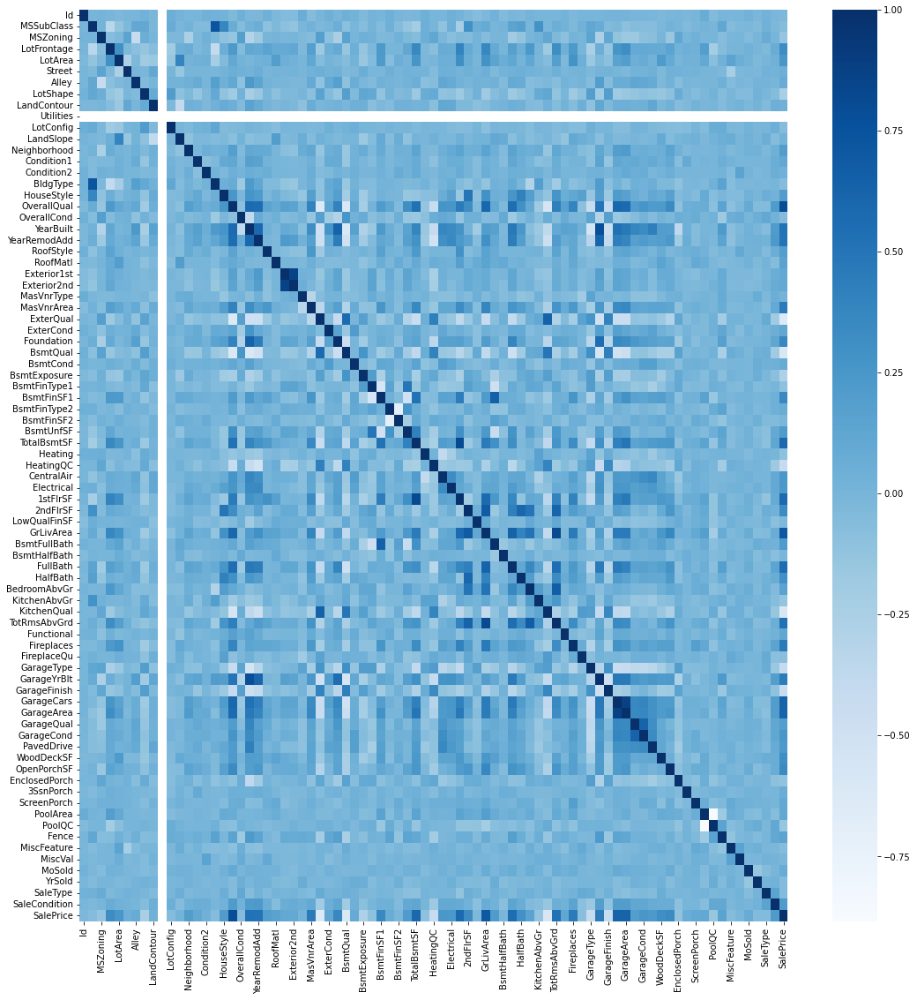

In [196]:
plt.figure(figsize = (18,19))
sns.heatmap(df_train.corr(),cmap='Blues')

Key Observations :
* From the above heat map we can observe that SalePrice is highly correlated with variables like OverallQual, YearBuilt, TotalBsmtSF, 1stFlrSF, GrLivArea, FullBath, TotRmsAbvGrd, Fireplaces, GarageYrBlt, GarageArea
* SalePrice have negative correlation with GarageFinish, GarageType, KitchenQual, HeatingQC, BsmtQual, ExterQual

In [197]:
# To remove the outliers
from scipy.stats import zscore
for col in int_columns:
    from scipy.stats import zscore
    z=np.abs(zscore(df_train[col]))

In [198]:
Threshold=3
print(np.where(z>3))

(array([  78,  103,  141,  232,  241,  300,  305,  369,  394,  423,  504,
        561,  691,  839,  858,  914, 1032], dtype=int64),)


In [199]:
df_train_new=df_train[(z<3)]
df_train_new

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3,70.0,4928,1,1,0,3,0,4,0,13,2,2,4,2,6,5,1976,1976,1,1,8,9,2,0.0,3,4,1,2,4,4,0,120,6,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,5,1,1977.0,2,2,440,5,5,2,0,205,0,0,0,0,3,4,1,0,2,2007,8,4,128000
1,889,20,3,95.0,15865,1,1,0,3,0,4,1,12,2,2,0,2,8,6,1970,1970,0,5,12,13,2,0.0,2,2,2,4,1,1,0,351,5,823,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,5,1,1970.0,3,2,621,5,5,2,81,207,0,0,224,0,3,4,1,0,10,2007,8,4,268000
2,793,60,3,92.0,9920,1,1,0,3,0,1,0,15,2,2,0,5,7,5,1996,1997,1,1,7,7,2,0.0,2,4,2,2,4,0,2,862,6,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,5,1,1997.0,3,2,455,5,5,2,180,130,0,0,0,0,3,4,1,0,6,2007,8,4,269790
3,110,20,3,105.0,11751,1,1,0,3,0,4,0,14,2,2,0,2,6,6,1977,1977,3,1,8,9,1,480.0,3,4,1,2,4,4,1,705,6,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,5,1,1977.0,2,2,546,5,5,2,0,122,0,0,0,0,3,2,1,0,1,2010,0,4,190000
4,422,20,3,70.0,16635,1,1,0,3,0,2,0,14,2,2,0,2,6,7,1977,2000,1,1,4,4,3,126.0,2,4,1,2,4,4,0,1246,6,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,5,1,1977.0,0,2,529,5,5,2,240,0,0,0,0,0,3,4,1,0,6,2009,8,4,215000
5,1197,60,3,58.0,14054,1,1,0,3,0,4,0,8,2,2,0,5,7,5,2006,2006,1,1,11,12,2,0.0,2,4,2,2,4,0,6,0,6,0,879,879,1,0,1,4,879,984,0,1863,0,0,2,1,4,1,2,9,6,1,2,3,2006.0,0,3,660,5,5,2,100,17,0,0,0,0,3,4,1,0,11,2006,6,5,219210
6,561,20,3,70.0,11341,1,1,0,3,0,4,0,19,2,2,0,2,5,6,1957,1996,3,1,12,13,1,180.0,3,4,1,2,4,4,0,1302,6,0,90,1392,1,4,1,4,1392,0,0,1392,1,0,1,1,3,1,3,5,4,1,2,5,1957.0,3,2,528,5,5,2,0,0,0,0,95,0,3,4,1,0,5,2010,8,4,121500
7,1041,20,3,88.0,13125,1,1,3,3,0,0,0,19,2,2,0,2,5,4,1957,2000,1,1,12,13,0,67.0,3,4,1,4,4,4,5,168,1,682,284,1134,1,0,1,4,1803,0,0,1803,1,0,2,0,3,1,3,8,0,1,5,1,1957.0,2,2,484,5,5,2,0,0,0,0,0,0,3,0,1,0,1,2006,8,4,155000
8,503,20,3,70.0,9170,1,1,3,3,0,0,0,7,1,2,0,2,5,7,1965,1965,3,1,7,7,2,0.0,3,4,1,4,4,4,0,698,2,96,420,1214,1,0,1,4,1214,0,0,1214,1,0,1,0,2,1,3,6,6,0,3,5,1965.0,3,2,461,1,1,2,0,0,184,0,0,0,3,0,3,400,4,2007,8,4,140000
9,576,50,3,80.0,8480,1,1,3,3,0,4,0,12,2,2,0,0,5,5,1947,1950,1,1,7,7,2,0.0,3,4,1,4,4,4,5,442,6,0,390,832,1,4,1,4,832,384,0,1216,0,0,1,0,2,1,3,6,6,0,3,5,1947.0,3,1,336,5,5,2,158,0,102,0,0,0,3,4,1,0,10,2008,0,0,118500


In [200]:
df_train.shape

(1168, 81)

* There are 1167 rows and 81 columns in the old dataset

In [201]:
df_train_new.shape

(1151, 81)

* There are 1150 rows and 81 columns in the new dataset after removing outliers

In [202]:
# Now we can check for data loss

Dataloss = (((1168-1151)/1168)*100)
Dataloss

1.4554794520547945

We can observe that dataloss in zscore method after removing outliers of 1.4% which is less than 10%

In [203]:
df_train_new.skew()

Id                0.025807
MSSubClass        1.412924
MSZoning         -1.789382
LotFrontage       2.817186
LotArea          10.814265
Street          -16.896668
Alley            -0.201027
LotShape         -0.624492
LandContour      -3.096626
Utilities         0.000000
LotConfig        -1.125526
LandSlope         4.773129
Neighborhood      0.065036
Condition1        3.022147
Condition2       11.429662
BldgType          2.293252
HouseStyle        0.294479
OverallQual       0.072726
OverallCond       0.552589
YearBuilt        -0.559736
YearRemodAdd     -0.476116
RoofStyle         1.543823
RoofMatl          7.888871
Exterior1st      -0.612415
Exterior2nd      -0.594697
MasVnrType       -0.126957
MasVnrArea        2.750173
ExterQual        -1.791158
ExterCond        -2.516245
Foundation        0.025659
BsmtQual         -0.479313
BsmtCond         -2.805624
BsmtExposure     -0.992165
BsmtFinType1      0.088712
BsmtFinSF1        1.942052
BsmtFinType2     -3.115568
BsmtFinSF2        4.329615
B

In [204]:
skew=['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'LandContour', 'LotConfig', 'LandSlope', 'Condition1', 'Condition2', 'BldgType', 'RoofStyle', 'RoofMatl', 'MasVnrArea', 'ExterQual', 'ExterCond', 'BsmtCond', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'TotalBsmtSF', 'BsmtUnfSF', 'Heating', 'CentralAir', 'Electrical', '1stFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtHalfBath', 'KitchenAbvGr', 'KitchenQual', 'Functional', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fence', 'MiscFeature', 'MiscVal', 'SaleType', 'SaleCondition']
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [205]:
for col in skew:
    df_train_new[[col]]=scaler.fit_transform(df_train_new[[col]].values)

In [206]:
df_train_new.skew()

Id                0.025807
MSSubClass        0.064554
MSZoning          0.226057
LotFrontage       0.165326
LotArea           0.032160
Street          -16.896668
Alley            -0.201027
LotShape         -0.624492
LandContour      -2.565843
Utilities         0.000000
LotConfig        -1.036588
LandSlope         3.920177
Neighborhood      0.065036
Condition1        0.225942
Condition2        0.533104
BldgType          1.833533
HouseStyle        0.294479
OverallQual       0.072726
OverallCond       0.552589
YearBuilt        -0.559736
YearRemodAdd     -0.476116
RoofStyle        -0.308335
RoofMatl         -6.301985
Exterior1st      -0.612415
Exterior2nd      -0.594697
MasVnrType       -0.126957
MasVnrArea        0.456456
ExterQual        -0.605760
ExterCond        -2.269335
Foundation        0.025659
BsmtQual         -0.479313
BsmtCond         -2.506438
BsmtExposure     -0.992165
BsmtFinType1      0.088712
BsmtFinSF1       -0.403850
BsmtFinType2     -2.081691
BsmtFinSF2        2.368940
B

Hence the skewness is removed from the data

In [207]:
x_train=df_train_new.drop(['SalePrice'],axis=1)
x_train.shape

(1151, 80)

In [208]:
y_train=df_train_new['SalePrice']
y_train.shape

(1151,)

# Exploratory Data Analysis on test data :

In [209]:
housingtestdata=pd.read_csv('Housing_test.csv')

In [210]:
df_test=pd.DataFrame(housingtestdata)

In [211]:
df_test.shape

(292, 80)

In [212]:
df_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

We can see that there is no x variable added in the test dataset and hence we have only 80 variables in the dataset, these are x variables

In [213]:
int_col=df_test.select_dtypes(include=[int])

In [214]:
df_test.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [215]:
Na_cols=['Alley', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']
for col in Na_cols:
    (df_test[col].fillna('NA',inplace=True))

In [216]:
df_test.isnull().sum()

Id                0
MSSubClass        0
MSZoning          0
LotFrontage      45
LotArea           0
Street            0
Alley             0
LotShape          0
LandContour       0
Utilities         0
LotConfig         0
LandSlope         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
OverallCond       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType        1
MasVnrArea        1
ExterQual         0
ExterCond         0
Foundation        0
BsmtQual          0
BsmtCond          0
BsmtExposure      0
BsmtFinType1      0
BsmtFinSF1        0
BsmtFinType2      0
BsmtFinSF2        0
BsmtUnfSF         0
TotalBsmtSF       0
Heating           0
HeatingQC         0
CentralAir        0
Electrical        1
1stFlrSF          0
2ndFlrSF          0
LowQualFinSF      0
GrLivArea         0
BsmtFullBath      0
BsmtHalfBath      0
FullBath          0


In [217]:
test=['LotFrontage','MasVnrArea','MasVnrType','Electrical','GarageYrBlt']
for col in test:
    imputer = SimpleImputer(missing_values=np.nan,strategy='most_frequent')
    df_test[col]=imputer.fit_transform(df_test[col].values.reshape(-1,1))

In [218]:
df_test.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [219]:
# Encoding the columns that has object dtype
Object_columns1=df_test.select_dtypes(include=[object])
Object_columns1.head(1)

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NA,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,Hip,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Gd,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,NA,NA,NA,WD,Normal


In [220]:
le = LabelEncoder()
for columns in Object_columns1:
    df_test[columns] = le.fit_transform(df_test[columns])

In [221]:
df_test.dtypes

Id                 int64
MSSubClass         int64
MSZoning           int32
LotFrontage      float64
LotArea            int64
Street             int32
Alley              int32
LotShape           int32
LandContour        int32
Utilities          int32
LotConfig          int32
LandSlope          int32
Neighborhood       int32
Condition1         int32
Condition2         int32
BldgType           int32
HouseStyle         int32
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle          int32
RoofMatl           int32
Exterior1st        int32
Exterior2nd        int32
MasVnrType         int32
MasVnrArea       float64
ExterQual          int32
ExterCond          int32
Foundation         int32
BsmtQual           int32
BsmtCond           int32
BsmtExposure       int32
BsmtFinType1       int32
BsmtFinSF1         int64
BsmtFinType2       int32
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating            int32


In [222]:
# To remove the outliers
from scipy.stats import zscore
for col in int_col:
    z=np.abs(zscore(df_test[col]))

In [223]:
Threshold=3
print(np.where(z>3))

(array([], dtype=int64),)


There are no outiers in the test data

In [224]:
df_test.skew()

Id               -0.108806
MSSubClass        1.358597
MSZoning          0.187174
LotFrontage       0.601264
LotArea          12.781805
Street          -12.020386
Alley            -1.130060
LotShape         -0.639195
LandContour      -3.332422
Utilities        17.088007
LotConfig        -1.204667
LandSlope         4.639043
Neighborhood      0.046894
Condition1        2.808950
Condition2       17.088007
BldgType          1.997202
HouseStyle        0.386773
OverallQual       0.397312
OverallCond       1.209714
YearBuilt        -0.755233
YearRemodAdd     -0.535600
RoofStyle         1.386333
RoofMatl         13.717569
Exterior1st      -0.643455
Exterior2nd      -0.672944
MasVnrType        0.037914
MasVnrArea        1.978463
ExterQual        -1.920606
ExterCond        -3.595056
Foundation        0.380626
BsmtQual         -0.536455
BsmtCond         -3.979314
BsmtExposure     -1.083777
BsmtFinType1      0.149521
BsmtFinSF1        0.739790
BsmtFinType2     -3.326370
BsmtFinSF2        3.698543
B

In [225]:
skew1=['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'LandContour', 'LotConfig', 'LandSlope', 'Condition1', 'Condition2', 'BldgType', 'RoofStyle', 'RoofMatl', 'MasVnrArea', 'ExterQual', 'ExterCond', 'BsmtCond', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'TotalBsmtSF', 'BsmtUnfSF', 'Heating', 'CentralAir', 'Electrical', '1stFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtHalfBath', 'KitchenAbvGr', 'KitchenQual', 'Functional', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fence', 'MiscFeature', 'MiscVal', 'SaleType', 'SaleCondition']
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [226]:
for col in skew1:
    df_test[[col]]=scaler.fit_transform(df_test[[col]].values)

Hence the skewness is removed from the test data

In [227]:
x_test=df_test

In [228]:
x_test.shape

(292, 80)

As we discussed before that Id variable is not making any impact on SalePrice we can drop this variable from both test and train data

In [229]:
x_train.drop(['Id'],axis=1,inplace=True)
x_test.drop(['Id'],axis=1,inplace=True)

In [230]:
x_train.shape,x_test.shape

((1151, 79), (292, 79))

In [231]:
# Checking for multicolinearity in the data
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [232]:
def vif_calc():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x_train.values,i)for i in range(x_train.shape[1])]
    vif["Features"]=x_train.columns
    print(vif)

In [233]:
vif_calc()

      VIF Factor       Features
0   5.717982e+00     MSSubClass
1   1.714020e+00       MSZoning
2   2.175931e+00    LotFrontage
3   2.757669e+00        LotArea
4   1.186628e+00         Street
5   2.206015e+01          Alley
6   3.836258e+00       LotShape
7   1.593394e+00    LandContour
8            NaN      Utilities
9   1.168913e+00      LotConfig
10  1.628392e+00      LandSlope
11  6.347864e+00   Neighborhood
12  1.206104e+00     Condition1
13  1.155558e+00     Condition2
14  4.684584e+00       BldgType
15  8.620887e+00     HouseStyle
16  8.491958e+01    OverallQual
17  4.989141e+01    OverallCond
18  3.820146e+04      YearBuilt
19  2.723346e+04   YearRemodAdd
20  1.363773e+00      RoofStyle
21  1.445617e+00       RoofMatl
22  3.881997e+01    Exterior1st
23  3.653096e+01    Exterior2nd
24  1.485168e+01     MasVnrType
25  2.014077e+00     MasVnrArea
26  2.875335e+00      ExterQual
27  1.230870e+00      ExterCond
28  1.061776e+01     Foundation
29  1.426819e+01       BsmtQual
30  1.49

From the heat map we can observe that PoolArea and PoolQC, GarageCars and GarageArea, GarageQual and GarageCond, Exterior1st and Exterior2nd, Utilities are having similar correlations to SalePrice, Hence we can drop of either one of these pairs to reduce multicollinearity

In [234]:
x_train.drop(['PoolQC','GarageCars','GarageCond','Exterior2nd','Utilities'],axis=1,inplace=True)
x_test.drop(['PoolQC','GarageCars','GarageCond','Exterior2nd','Utilities'],axis=1,inplace=True)

In [235]:
x_train.shape,x_test.shape

((1151, 74), (292, 74))

In [236]:
from sklearn.linear_model import Ridge, Lasso
lm=LinearRegression()
DTR=DecisionTreeRegressor()
KNR=KNeighborsRegressor()
svr=SVR()
La=Lasso()
rd=Ridge()

In [237]:
model=[lm,DTR,KNR,svr,La,rd]
for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    pred=m.predict(x_test)
    print("Score of ",m,"is :",m.score(x_train,y_train))
    print('\n')

Score of  LinearRegression() is : 0.8652413853354501


Score of  DecisionTreeRegressor() is : 1.0


Score of  KNeighborsRegressor() is : 0.731103114938408


Score of  SVR() is : -0.04677351659363316


Score of  Lasso() is : 0.8652413443715304


Score of  Ridge() is : 0.8652406950756619




We can see the accuracy of the model as 
* LinearRegression() is  86.52%
* DecisionTreeRegressor() is 100%
* Lasso() is 86.52%
* Ridge() is 86.52%

and consider these models to work well

In [238]:
#WE can now try with Cross validation for the models 
from sklearn.model_selection import cross_val_score
model=[lm,DTR,KNR,svr,La,rd]
for i in model:
    score=cross_val_score(i,x_train,y_train,cv=5)
    print("score of ",i,"is :",score)
    print("score mean of ",i,"is :",score.mean())
    print("score std of ",i,"is :",score.std())
    print('\n')

score of  LinearRegression() is : [0.87529894 0.75326124 0.66005979 0.84369656 0.8340751 ]
score mean of  LinearRegression() is : 0.7932783253994786
score std of  LinearRegression() is : 0.07782326473576157


score of  DecisionTreeRegressor() is : [0.70518447 0.70692159 0.66190538 0.77868213 0.59351638]
score mean of  DecisionTreeRegressor() is : 0.6892419897449246
score std of  DecisionTreeRegressor() is : 0.060789723262148945


score of  KNeighborsRegressor() is : [0.66793667 0.6215595  0.51119424 0.62165788 0.47095194]
score mean of  KNeighborsRegressor() is : 0.5786600459802715
score std of  KNeighborsRegressor() is : 0.07458171814039995


score of  SVR() is : [-0.02774164 -0.12123798 -0.03193815 -0.09422959 -0.00442891]
score mean of  SVR() is : -0.055915256093951
score std of  SVR() is : 0.04416909302945924


score of  Lasso() is : [0.87530265 0.75337929 0.66023566 0.84370573 0.83410881]
score mean of  Lasso() is : 0.7933464266676511
score std of  Lasso() is : 0.07775641480163664

In [239]:
# Parameter tuning with DecissionTreeRegressor

from sklearn.model_selection import GridSearchCV
DTR=DecisionTreeRegressor()
params={'criterion':['squared_error','friedman_mse','absolute_error','poisson']}
grd=GridSearchCV(estimator=DTR,param_grid=params,cv=5)
grd.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'friedman_mse',
                                       'absolute_error', 'poisson']})

In [240]:
grd.best_params_

{'criterion': 'absolute_error'}

In [241]:
grd.best_score_

0.7107955987080117

In [242]:
# Parameter tuning for RandomForestClassifier

from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
params={'criterion':['gini','entropy','log_loss']}

In [243]:
grd=GridSearchCV(estimator=rf,param_grid=params,cv=5)

In [244]:
grd.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss']})

In [245]:
grd.best_score_

0.026060606060606062

In [246]:
grd.best_params_

{'criterion': 'entropy'}

In [247]:
# Parameter tuning for Lasso()

param_alpha={'alpha':[0.0001,0.001,0.01,0.1,1,10]}
ls=Lasso()
gd=GridSearchCV(estimator=ls,param_grid=param_alpha,cv=5)
gd.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10]})

In [248]:
gd.best_score_

0.7939513771171223

In [249]:
gd.best_params_

{'alpha': 10}

In [250]:
#Parameter tuning for Ridge()

param_alpha={'alpha':[.0001,.001,.01,.1]}
rd=Ridge()
gd=GridSearchCV(estimator=rd,param_grid=param_alpha,cv=5)
gd.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1]})

In [251]:
gd.best_score_

0.7933266023539222

In [252]:
gd.best_params_

{'alpha': 0.1}

# Saving the model

In [253]:
final_model=Lasso(alpha=10)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)

In [254]:
print('Score:',final_model.score(x_train,y_train)*100)

Score: 86.5237320653474


We are finalizing Lasso as the best model with alpha value 10 which is giving accuracy of 86.52%

In [255]:
import joblib
joblib.dump(final_model,'Housing_price_Prediction.obj')

['Housing_price_Prediction.obj']

Loading the saved model and predicting the values

In [256]:
Housing_project=joblib.load('Housing_price_Prediction.obj')

In [257]:
pred=Housing_project.predict(x_test)
print("Predicted values :",pred)

Predicted values : [305092.12196239 216976.5826344  246236.49934091 167300.87094257
 231164.62894571  70602.40720751 134129.85091524 293037.96831889
 240983.75544371 176148.9782253   38197.12451002 138368.33861095
 121388.3714532  204847.35772087 287523.34142939 125451.43340464
 112441.08898852 117437.85906893 192001.78660226 214695.3797683
 165540.41975962 146683.53864455 140436.16645501  62833.34943118
 104503.24489838 118489.86460012 169219.07583763 144687.86254598
 172179.83934112  75759.73630466 164375.61924447 205850.5566806
 238453.47570104 185000.6403129  121567.08882706 165056.22455139
 195233.67818474 104383.7517834  153127.70049929 138412.27287956
  96827.25378049 284100.48706056 215949.53418197 200528.04428012
 141660.55865508 152425.28715382 120957.45373633  88148.59789948
 216685.22322597 304632.65699754 132200.61686311 219025.22584262
  79541.7309127   77586.6022211  248214.10590909 117525.12457152
 143717.28403721 196730.68206974 107608.21064594 239978.09882112
  81250.

In [258]:
# Making a DataFrame of Predicted values
df1=pd.DataFrame({'Predicted values':pred.round(2)})
df1

,Predicted values
0,305092.12
1,216976.58
2,246236.50
3,167300.87
4,231164.63
5,70602.41
6,134129.85
7,293037.97
8,240983.76
9,176148.98
